In [16]:
from turtledemo.forest import start

from PIL import Image
import shutil
from pathlib import Path
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn
from histopathology_dataset import create_dataset, ImageDataset


In [7]:
!cd .. | pwd

/home/dzakirm/Research/Histopathology/histopathology


In [8]:
data = create_dataset('OHEheparfix', "../data/processed/")
cluster_label = np.load("../data/processed/kmeans_label.npy")

../data/processed/OHEheparfix.csv


In [9]:
cluster_label

array([4, 4, 1, ..., 4, 4, 4], dtype=int32)

In [10]:
labeled_data = [{"Path_image": image, "cluster": cluster} for (image, cluster) in zip(data[0], cluster_label)]
df = pd.DataFrame(labeled_data)
df.to_csv("../data/processed/image_cluster_labels.csv", index=False)

In [11]:
grouped_cluster = df.groupby('cluster')['Path_image'].agg(list)

In [12]:
grouped_cluster

cluster
0    [../data/processed//HeparUnifiedPNG/Hepar-HFDA...
1    [../data/processed//HeparUnifiedPNG/Hepar-HFDA...
2    [../data/processed//HeparUnifiedPNG/Hepar-HFDA...
3    [../data/processed//HeparUnifiedPNG/Hepar-HFDA...
4    [../data/processed//HeparUnifiedPNG/Hepar-HFDA...
5    [../data/processed//HeparUnifiedPNG/Hepar-HFDA...
Name: Path_image, dtype: object

In [13]:
grouped_cluster[0]

['../data/processed//HeparUnifiedPNG/Hepar-HFDA151X10-1_T11.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA151X10-1_T09.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA151X10-1_T22.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA151X10-1_T31.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA151X10-1_T41.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA151X10-1_T32.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA152X10-1_T71.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA254X40-2_T00.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA152X40-1a_T00.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDSIMV2X40-1_T01.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDSIMV2X40-1_T00.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA251X40-1_T10.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA254X40-1_T01.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDA53X40-1_T10.png',
 '../data/processed//HeparUnifiedPNG/Hepar-HFDSIMV2X40-1_T11.png',
 '../da

In [17]:
for cluster, images in enumerate(grouped_cluster):
    data_path = Path(f"../data/ClusteredImages/Cluster_{cluster}")
    
    data_path.mkdir(exist_ok=True, parents=True)
    
    for image_path in images:
        img_path = Path(image_path)
        shutil.copy(img_path, data_path)
    

In [ ]:


# Example list of images
images = [Image.new('RGB', (100, 100), color) for color in ['red', 'green', 'blue']]

# Directory to save images
save_folder = "saved_images"

# Create the folder if it doesn't exist
os.makedirs(save_folder, exist_ok=True)

# Save each image in the list
for idx, img in enumerate(images):
    img.save(os.path.join(save_folder, f"image_{idx+1}.png"))


In [15]:
data[0][0][41:]

'HFDA151X10-2_T00.png'

In [104]:
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
import numpy as np

def add_label(image, label, font_size=12):
    # Create a drawing context on the image
    draw = ImageDraw.Draw(image)

    # You can specify a font if you have one; otherwise, the default font will be used.
    try:
        font = ImageFont.truetype("arial.ttf", font_size)
    except IOError:
        font = ImageFont.load_default()

    # Position for the text, adding padding if necessary
    text_position = (5, image.size[1] - font_size - 5)
    draw.text(text_position, label, fill="black", font=font)
    return image

def create_collage(images, labels, grid_size=(3, 3), img_size=(100, 100)):
    # Resize images and add labels
    labeled_images = [add_label(img.resize(img_size), label) for img, label in zip(images, labels)]
    # labeled_images = [img.resize(img_size) for img in images]

    # Create a blank canvas for the collage
    collage = Image.new('RGB', (grid_size[1] * img_size[0], grid_size[0] * img_size[1]))

    # Place each labeled image in the correct grid location
    for i, image in enumerate(labeled_images):
        row = i // grid_size[1]
        col = i % grid_size[1]
        collage.paste(image, (col * img_size[0], row * img_size[1]))

    return collage




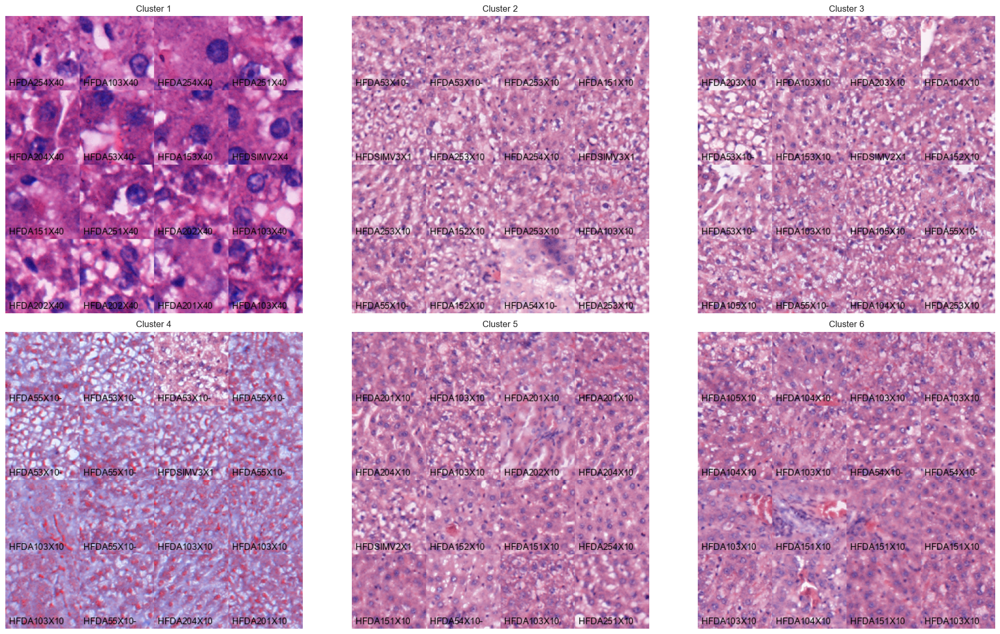

In [105]:
# Load images and labels for each cluster (example: 5 clusters with 9 images each)
# Replace these with actual Image objects and labels for each cluster
grid_size = (4, 4)
start_index, offset = 40, grid_size[0] ** 2

cluster_images = [
    [Image.open(i) for i in grouped_cluster[0][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[1][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[2][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[3][start_index: start_index + offset]],
    [Image.open(i) for i in grouped_cluster[4][start_index: start_index + offset]],
    [Image.open(i) for i in grouped_cluster[5][start_index: start_index + offset]],
]

cluster_labels = [
    [f"{i[41:51]}" for i in grouped_cluster[0][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[1][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[2][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[3][start_index: start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[4][start_index: start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[5][start_index: start_index + offset]],
]

# Create collages for each cluster with labels
cluster_collages = [create_collage(images, labels, grid_size=grid_size) for images, labels in zip(cluster_images, cluster_labels)]

# Plot the cluster collages in a single grid (2x3 grid for 5 clusters)
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, collage in enumerate(cluster_collages):
    axes[i].imshow(collage)
    axes[i].set_title(f'Cluster {i+1}')
    axes[i].axis('off')

# Hide any extra subplot axes if you don't have exactly 6 clusters
for j in range(len(cluster_collages), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


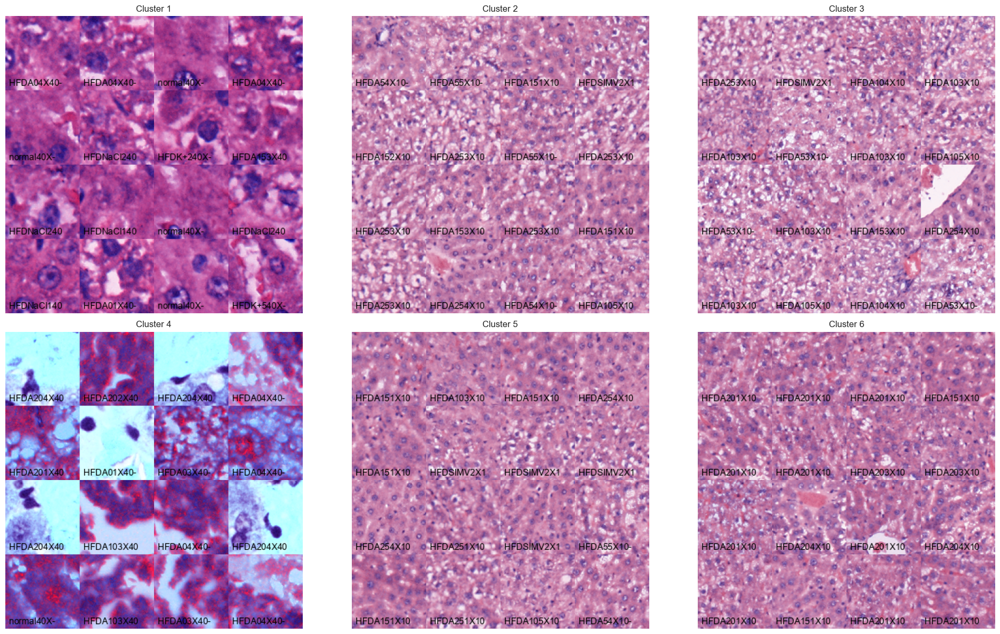

In [106]:
# Load images and labels for each cluster (example: 5 clusters with 9 images each)
# Replace these with actual Image objects and labels for each cluster
grid_size = (4, 4)
start_index, offset = 100, grid_size[0] ** 2

cluster_images = [
    [Image.open(i) for i in grouped_cluster[0][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[1][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[2][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[3][start_index: start_index + offset]],
    [Image.open(i) for i in grouped_cluster[4][start_index: start_index + offset]],
    [Image.open(i) for i in grouped_cluster[5][start_index: start_index + offset]],
]

cluster_labels = [
    [f"{i[41:51]}" for i in grouped_cluster[0][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[1][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[2][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[3][start_index: start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[4][start_index: start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[5][start_index: start_index + offset]],
]

# Create collages for each cluster with labels
cluster_collages = [create_collage(images, labels, grid_size=grid_size) for images, labels in zip(cluster_images, cluster_labels)]

# Plot the cluster collages in a single grid (2x3 grid for 5 clusters)
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, collage in enumerate(cluster_collages):
    axes[i].imshow(collage)
    axes[i].set_title(f'Cluster {i+1}')
    axes[i].axis('off')

# Hide any extra subplot axes if you don't have exactly 6 clusters
for j in range(len(cluster_collages), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()



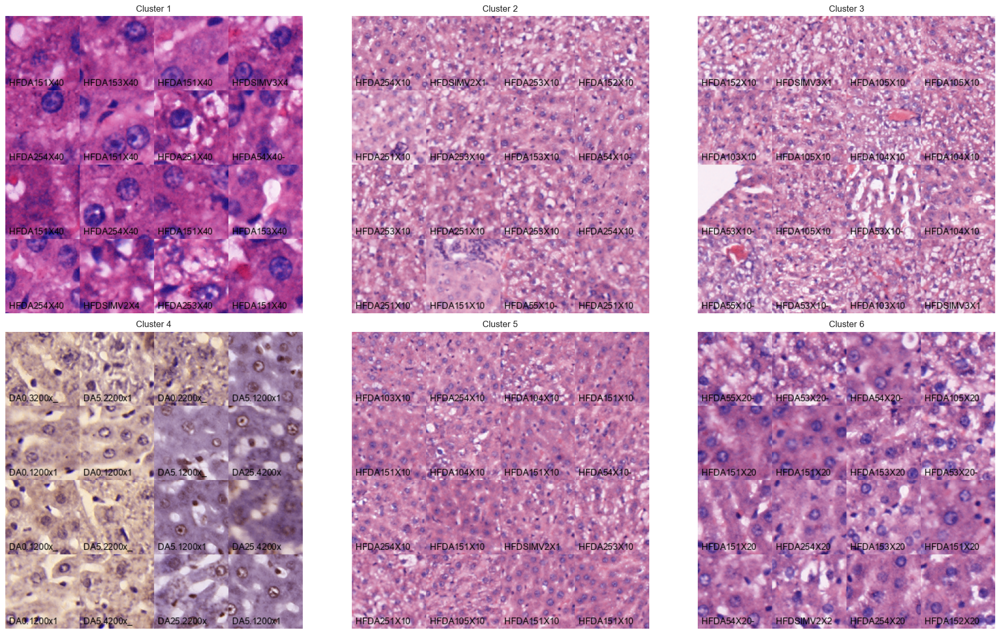

In [108]:
# Load images and labels for each cluster (example: 5 clusters with 9 images each)
# Replace these with actual Image objects and labels for each cluster
grid_size = (4, 4)
start_index, offset = 200, grid_size[0] ** 2

cluster_images = [
    [Image.open(i) for i in grouped_cluster[0][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[1][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[2][start_index:start_index + offset]],
    [Image.open(i) for i in grouped_cluster[3][start_index: start_index + offset]],
    [Image.open(i) for i in grouped_cluster[4][start_index: start_index + offset]],
    [Image.open(i) for i in grouped_cluster[5][start_index: start_index + offset]],
]

cluster_labels = [
    [f"{i[41:51]}" for i in grouped_cluster[0][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[1][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[2][start_index:start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[3][start_index: start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[4][start_index: start_index + offset]],
    [f'{i[41:51]}' for i in grouped_cluster[5][start_index: start_index + offset]],
]

# Create collages for each cluster with labels
cluster_collages = [create_collage(images, labels, grid_size=grid_size) for images, labels in zip(cluster_images, cluster_labels)]

# Plot the cluster collages in a single grid (2x3 grid for 5 clusters)
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, collage in enumerate(cluster_collages):
    axes[i].imshow(collage)
    axes[i].set_title(f'Cluster {i+1}')
    axes[i].axis('off')

# Hide any extra subplot axes if you don't have exactly 6 clusters
for j in range(len(cluster_collages), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

